# Map Northeast Capacity Data

Source: Canadian Center for Energy Information

 - [Installed plants, annual generating capacity by type of electricity generation](https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=2510002201)
 - [Power Plants, 100 MW or more - North American Cooperation on Energy Information - Power Plants, 100 MW or more](https://open.canada.ca/data/en/dataset/40fbe40c-01cd-49d3-8add-0d20ed64c90d/resource/0a0cde7c-322e-49e5-a93a-372c0a5a83d8)
 - [Renewable Energy Power Plants, 1 MW or more - North American Cooperation on Energy Information - Renewable Energy Power Plants, 1 MW or more](https://open.canada.ca/data/en/dataset/490db619-ab58-4a2a-a245-2376ce1840de/resource/7e2e943b-47c2-4e7b-913d-4146d9b4b3a3)
 
 
To Explore Next:
- [Open Infrastructure Map](https://openinframap.org/#5/44.24/-74.11)
- [Calculate Capacity of Transmission Lines](https://www.imse.iastate.edu/files/2021/03/EnergyProject_Capacity_of_Transmission_Lines.pdf)
 
## Preliminary Setup

In [1]:
# Import Libraries
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
#import contextily as cx
import folium
from pywaffle import Waffle

In [2]:
# Set Parameters
crs = 'epsg:4326'

# Set Filepaths
installed_cap_filepath = "Installed_Plants_by_Type_2018_to_2022/25100022.csv"
plants_cap_filepath = "PowerPlants_100+MW_2021/PowerPlantsAllGE100MW_NorthAmerica_201708.xlsx"
renews_cap_filepath = "RenewPlants_1MW+_2021/PowerPlantsRenewGE1MW_NorthAmerica_201708.xlsx"
political_bounds_filepath = "../Common Data/North American Political Boundaries/PoliticalBoundaries_Shapefile/boundaries_p_2021_v3.shp"

# Set Technology Colors
tech_colors = {
    'Biomass' : 'xkcd:forest green',
    'Coal' : 'xkcd:medium grey',
    'Geothermal' : 'xkcd:orange',
    'Hydroelectric' : 'xkcd:blue',
    'Natural Gas' : 'xkcd:olive green',
    'Nuclear' : 'xkcd:violet',
    'Other' : 'xkcd:brown',
    'Petroleum' : 'xkcd:black',
    'Pumped Storage' : 'xkcd:periwinkle',
    'Solar' : 'xkcd:goldenrod',
    'Wind' : 'xkcd:baby blue'
}
tech_colors_hex = {
    'Biomass' : '#06470c',
    'Coal' : '#7d7f7c',
    'Geothermal' : '#f97306',
    'Hydroelectric' : '#0343df',
    'Natural Gas' : '#677a04',
    'Nuclear' : '#9a0eea',
    'Other' : '#653700',
    'Petroleum' : '#000000',
    'Pumped Storage' : '#8e82fe',
    'Solar' : '#fac205',
    'Wind' : '#a2cffe'
}

In [3]:
# Read Political Boundaries
gdf_na = gpd.read_file(political_bounds_filepath)
gdf_na

,NAME_En,NAME_Es,NAME_Fr,COUNTRY,STATEABB,CAPITAL,AreaKm2,geometry
0,Aguascalientes,Aguascalientes,Aguascalientes,MEX,MX-AGU,Aguascalientes,5630.27,"POLYGON ((-195799.916 -2535176.735, -195800.01..."
1,Alabama,Alabama,Alabama,USA,US-AL,Montgomery,133970.00,"MULTIPOLYGON (((1123307.715 -1544099.835, 1123..."
2,Alaska,Alaska,Alaska,USA,US-AK,Juneau,1513320.00,"MULTIPOLYGON (((-1935079.764 1544584.815, -193..."
3,Alberta,Alberta,Alberta,CAN,CA-AB,Edmonton,660262.00,"POLYGON ((-701724.220 1721501.958, -701699.563..."
4,Arizona,Arizona,Arizona,USA,US-AZ,Phoenix,295294.00,"POLYGON ((-803303.106 -845580.853, -803399.475..."
...,...,...,...,...,...,...,...,...
93,Wisconsin,Wisconsin,Wisconsin,USA,US-WI,Madison,145032.00,"MULTIPOLYGON (((678886.458 253804.267, 678798...."
94,Wyoming,Wyoming,Wyoming,USA,US-WY,Cheyenne,252880.00,"POLYGON ((-865796.146 59349.771, -865059.040 5..."
95,Yucatan,Yucatán,Yucatán,MEX,MX-YUC,Mérida,39575.60,"MULTIPOLYGON (((1068098.940 -2564059.695, 1068..."
96,Yukon,Yukón,Yukon,CAN,CA-YT,Whitehorse,480612.00,"MULTIPOLYGON (((-1460567.237 3078155.449, -146..."


In [4]:
# Take Regional Subset (US Northeast + Ontario + Quebec)
region_list = ['US-ME','US-MA','US-NH','US-VT','US-NH','US-CT','US-RI','US-NY','CA-ON','CA-QC']
region_list_full = ['Maine','Massachusetts','Vermont','New Hampshire','Connecticut','Rhode Island','New York','Ontario','Quebec','Québec']
gdf_ne = gdf_na.loc[gdf_na.STATEABB.isin(region_list)]
gdf_ne = gdf_ne.to_crs(crs)
gdf_ne

,NAME_En,NAME_Es,NAME_Fr,COUNTRY,STATEABB,CAPITAL,AreaKm2,geometry
16,Connecticut,Connecticut,Connecticut,USA,US-CT,Hartford,12906.00,"MULTIPOLYGON (((-73.64045 40.99464, -73.63932 ..."
34,Maine,Maine,Maine,USA,US-ME,Augusta,84693.80,"MULTIPOLYGON (((-68.26609 44.28274, -68.26847 ..."
37,Massachusetts,Massachusetts,Massachusetts,USA,US-MA,Boston,21187.90,"MULTIPOLYGON (((-71.01149 42.30930, -71.01460 ..."
51,New Hampshire,Nuevo Hampshire,New Hampshire,USA,US-NH,Concord,23990.60,"MULTIPOLYGON (((-71.08392 45.30545, -71.07691 ..."
54,New York,Nueva York,New York,USA,US-NY,Albany,126758.00,"MULTIPOLYGON (((-74.03761 40.69921, -74.03900 ..."
65,Ontario,Ontario,Ontario,CAN,CA-ON,Toronto,986036.00,"MULTIPOLYGON (((-80.66256 45.76349, -80.66251 ..."
71,Quebec,Quebec,Québec,CAN,CA-QC,Quebec City,1504520.00,"MULTIPOLYGON (((-79.43758 54.28665, -79.43716 ..."
74,Rhode Island,Rhode Island,Rhode Island,USA,US-RI,Providence,2840.87,"MULTIPOLYGON (((-71.40204 41.50008, -71.40408 ..."
89,Vermont,Vermont,Vermont,USA,US-VT,Montpelier,24851.70,"POLYGON ((-71.48055 45.00233, -71.48855 45.001..."


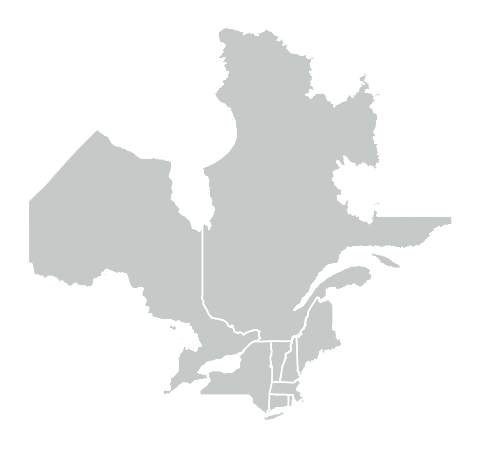

In [5]:
# Show Political Boundaries in Model Region
fig, ax = plt.subplots(figsize=(12, 8))
gdf_ne.plot(ax=ax, color='xkcd:silver')
gdf_ne.boundary.plot(ax=ax, color='xkcd:white')
plt.axis('off')
plt.show()

## Read Data Sources

In [6]:
# Read Power Plants Data
df_powerplants = pd.read_excel(plants_cap_filepath)
df_powerplants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Hydroelectric (MW),Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period
0,Mexico,Raúl J. Marsal (Comedero),CFE,CFE,24.570669,-106.808369,Cosalá,NaN,Sinaloa,NaN,...,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0,CFE-CENACE,201708
1,Mexico,Iberdrola Energía La Laguna,"Iberdrola Energía La Laguna, S. A. De C. V.","Iberdrola Energía La Laguna, S. A. De C. V.",25.601015,-103.468589,Gómez Palacio,NaN,Durango,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,CFE-CENACE,201708
2,Mexico,Parques Ecológicos De México,"Parques Ecológicos De México, S. A. De C. V.","Parques Ecológicos De México, S. A. De C. V.",16.528297,-94.932617,Juchitán,NaN,Oaxaca,NaN,...,0.0,0.0,0.0,0.0,101.9,0.0,0.0,0,CFE-CENACE,201708
3,Mexico,La Mata,CFE/PIE,CFE,16.538986,-94.999333,Asunción Ixtaltepec,NaN,Oaxaca,NaN,...,0.0,0.0,0.0,0.0,102.0,0.0,0.0,0,CFE-CENACE,201708
4,Mexico,Oaxaca I,CFE/PIE,CFE,16.564282,-94.721195,Santo Domingo Ingenio,NaN,Oaxaca,NaN,...,0.0,0.0,0.0,0.0,102.0,0.0,0.0,0,CFE-CENACE,201708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2261,Canada,Gros Morne I,Innergex Inc (38%) / TransCanada (42%),NaN,49.180970,-65.461476,NaN,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612
2262,Canada,L'Anse-à-Valleau,Cartier Wind Energy,Cartier Wind Energy,49.079763,-64.628920,Gaspe,NaN,Québec,G4X 4A1,...,0.0,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612
2263,Canada,Meikle Wind,NaN,Meikle Wind Energy LP,55.285560,-121.469056,Tumbler Ridge,NaN,British Columbia,NaN,...,0.0,0.0,0.0,0.0,185.0,0.0,0.0,0,BC Hydro IPP supply,201704
2264,Canada,Mont-Louis,Northland Power,Northland Power,49.181825,-65.650211,Mont-Louis,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612


In [7]:
# Take Regional Subset
df_r_powerplants = df_powerplants.loc[df_powerplants['State / Province / Territory'].isin(region_list_full)]
df_r_powerplants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Hydroelectric (MW),Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period
133,United States,500MW CC,New York Power Authority,NaN,40.788900,-73.906900,Astoria,Queens,New York,11105,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
169,United States,Androscoggin Energy Center,Verso Paper Androscoggin LLC,NaN,44.506315,-70.242312,Jay,Franklin,Maine,4239,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
171,United States,ANP Bellingham Energy Project,ANP Bellingham Energy Company LLC,NaN,42.110577,-71.453468,Bellingham,Norfolk,Massachusetts,2019,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
172,United States,ANP Blackstone Energy Project,ANP Blackstone Energy Company LLC,NaN,42.059876,-71.515811,Blackstone,Worcester,Massachusetts,1504,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
192,United States,Arthur Kill Generating Station,NRG Arthur Kill Operations Inc,NaN,40.591564,-74.200035,Staten Island,Richmond,New York,10314,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260,Canada,Chats Fall / Chute-des-Chats,Ontario Power Generation/Hydro-Electric Power ...,Ontario Power Generation/Hydro-Electric Power ...,45.475194,-76.238193,Pontiac,NaN,Québec,NaN,...,192.0,0.0,0.0,0.0,0.0,0.0,0.0,0,OPG,201708
2261,Canada,Gros Morne I,Innergex Inc (38%) / TransCanada (42%),NaN,49.180970,-65.461476,NaN,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612
2262,Canada,L'Anse-à-Valleau,Cartier Wind Energy,Cartier Wind Energy,49.079763,-64.628920,Gaspe,NaN,Québec,G4X 4A1,...,0.0,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612
2264,Canada,Mont-Louis,Northland Power,Northland Power,49.181825,-65.650211,Mont-Louis,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612


In [8]:
# Transform Data into GeoDataFrame
gdf_r_powerplants = gpd.GeoDataFrame(
    df_r_powerplants, geometry=gpd.points_from_xy(df_r_powerplants.Longitude, df_r_powerplants.Latitude), crs=crs
)
gdf_r_powerplants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period,geometry
133,United States,500MW CC,New York Power Authority,NaN,40.788900,-73.906900,Astoria,Queens,New York,11105,...,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-73.90690 40.78890)
169,United States,Androscoggin Energy Center,Verso Paper Androscoggin LLC,NaN,44.506315,-70.242312,Jay,Franklin,Maine,4239,...,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-70.24231 44.50632)
171,United States,ANP Bellingham Energy Project,ANP Bellingham Energy Company LLC,NaN,42.110577,-71.453468,Bellingham,Norfolk,Massachusetts,2019,...,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.45347 42.11058)
172,United States,ANP Blackstone Energy Project,ANP Blackstone Energy Company LLC,NaN,42.059876,-71.515811,Blackstone,Worcester,Massachusetts,1504,...,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.51581 42.05988)
192,United States,Arthur Kill Generating Station,NRG Arthur Kill Operations Inc,NaN,40.591564,-74.200035,Staten Island,Richmond,New York,10314,...,0.0,0.0,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-74.20003 40.59156)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260,Canada,Chats Fall / Chute-des-Chats,Ontario Power Generation/Hydro-Electric Power ...,Ontario Power Generation/Hydro-Electric Power ...,45.475194,-76.238193,Pontiac,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0,OPG,201708,POINT (-76.23819 45.47519)
2261,Canada,Gros Morne I,Innergex Inc (38%) / TransCanada (42%),NaN,49.180970,-65.461476,NaN,NaN,Québec,NaN,...,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612,POINT (-65.46148 49.18097)
2262,Canada,L'Anse-à-Valleau,Cartier Wind Energy,Cartier Wind Energy,49.079763,-64.628920,Gaspe,NaN,Québec,G4X 4A1,...,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612,POINT (-64.62892 49.07976)
2264,Canada,Mont-Louis,Northland Power,Northland Power,49.181825,-65.650211,Mont-Louis,NaN,Québec,NaN,...,0.0,0.0,0.0,100.5,0.0,0.0,0,CanWEA,201612,POINT (-65.65021 49.18183)


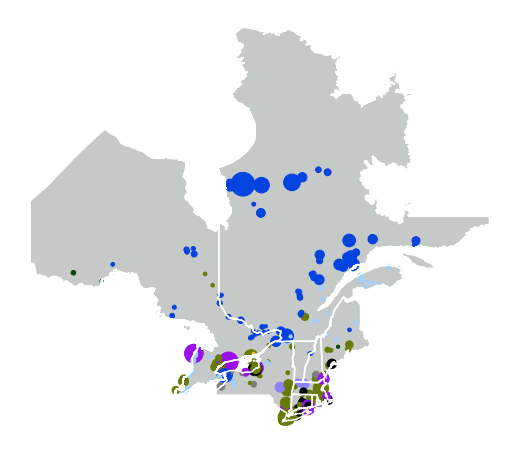

In [9]:
# Map Power Plants
gdf_r_powerplants['tech_color'] = gdf_r_powerplants['Primary Energy Source'].map(tech_colors)
gdf_r_powerplants['tech_color_hex'] = gdf_r_powerplants['Primary Energy Source'].map(tech_colors_hex)

# Map Power Plants, 100+ MW
fig, ax = plt.subplots(figsize=(12, 8))
gdf_ne.plot(ax=ax, color='xkcd:silver')
gdf_ne.boundary.plot(ax=ax, color='xkcd:white')
gdf_r_powerplants.plot(ax=ax, markersize=gdf_r_powerplants['Total Capacity (MW)'].div(10), color=gdf_r_powerplants['tech_color'])
plt.axis('off')
plt.show()

In [10]:
m = gdf_r_powerplants.explore(color=gdf_r_powerplants['tech_color_hex'], tiles="CartoDB positron")
m

In [11]:
# Variable Size through Iterative Plotting
m = folium.Map(zoom_start=5, location=[48.70, -73.94], tiles="CartoDB positron") # ,

# Tooltip
tooltip_fields = ['Facility Name', 'Primary Energy Source', 'Total Capacity (MW)', 'Total Renewable Capacity (MW)', 
        'State / Province / Territory', 'City (Site Name)', 'County',
        'Coal (MW)',
       'Natural Gas (MW)', 'Petroleum (MW)', 'Other Energy Source (MW)',
       'Hydroelectric (MW)', 'Pumped-Storage Hydroelectric (MW)',
       'Nuclear (MW)', 'Solar (MW)', 'Wind (MW)', 'Geothermal (MW)',
       'Biomass (MW)', 'Tidal (MW)', 'Owner Name (Company)', 'Operator Name']

for idx, row in gdf_r_powerplants.iterrows():
    radius = 2*np.log(row['Total Capacity (MW)']/20)
    tooltip = '<br>'.join(["<strong>{}</strong>  |  {}".format(val, field) for field, val in row[tooltip_fields].iteritems()])
    folium.CircleMarker(
        location=[row.Latitude, row.Longitude],
        radius=radius,
        color=tech_colors_hex[row['Primary Energy Source']],
        stroke=False,
        fill=True,
        fill_opacity=0.6,
        opacity=1,
        tooltip=tooltip
    ).add_to(m)
m

In [12]:
# Read Renewables Data (Renewable Power Plants of 1+ MW)
df_renewplants = pd.read_excel(renews_cap_filepath)
df_renewplants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Hydroelectric (MW),Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period
0,Mexico,Santa Rosalía,Comisión Federal de Electricidad,CFE,27.410710,-112.529196,Mulegé,NaN,Baja California Sur,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,CFE-CENACE,201708
1,Mexico,Plamex,"Plantronics, Inc.",Privado,32.416893,-115.234141,Tijuana,NaN,Baja California,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,CFE-CENACE,201708
2,Mexico,Tirio,Comisión Federal de Electricidad,CFE,19.629724,-101.258937,Morelia,NaN,Michoacán,NaN,...,1.1,0.0,0.0,0.0,0.0,0.0,0.0,0,CFE-CENACE,201708
3,Mexico,Hidroelectrica Cajon de Peña,"INDUSTRIAS WACK, S. A. DE C. V.",Privado,20.017135,-105.221590,Tomatlán,NaN,Jalisco,NaN,...,1.2,0.0,0.0,0.0,0.0,0.0,0.0,0,CFE-CENACE,201708
4,Mexico,Papelera Veracruzana,"Papelera Veracruzana, S. A. De C. V.",Privado,18.834267,-97.103047,Orizaba,NaN,Veracruz,NaN,...,1.3,0.0,0.0,0.0,0.0,0.0,0.0,0,CFE-CENACE,201708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6372,Canada,Upper Lillooet River,Innergex (66.7%) / Ledcor Power Group (33.3%),Innergex (66.7%) / Ledcor Power Group (33.3%),50.657000,-123.447636,Squamish-Lillooet,NaN,British Columbia,NaN,...,81.4,0.0,0.0,0.0,0.0,0.0,0.0,0,Innergex,201708
6373,Canada,Vents du Kempt,Le Club Éolectric (51%),Le Club Éolectric (51%),48.317179,-67.140794,Ste-Marguerite-Marie,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,101.1,0.0,0.0,0,CanWEA,201612
6374,Canada,Volcano Creek,NaN,Coast Mountain Hydro LP,56.728912,-130.597699,Stewart,NaN,British Columbia,NaN,...,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0,BC Hydro IPP supply,201704
6375,Canada,Walton Community Wind Project,Scotian Wind Fields,Scotian Wind Fields,45.197000,-63.968805,Walton,NaN,Nova Scotia,NaN,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0,CanWEA,201612


In [13]:
# Take Regional Subset
df_r_renewplants = df_renewplants.loc[df_renewplants['State / Province / Territory'].isin(region_list_full)]
df_r_renewplants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Hydroelectric (MW),Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period
131,United States,126 Grove Solar LLC,126 Grove Solar LLC,NaN,42.076119,-71.422707,Franklin,Norfolk,Massachusetts,2028,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
134,United States,158th Fighter Wing Solar Farm,158th Fighter Wing,NaN,44.477705,-73.153412,South Burlington,Chittenden,Vermont,5403,...,0.0,0.0,0.0,1.5,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
136,United States,201 Sturbridge B,SE Solarne2 LLC,NaN,42.109143,-72.171188,Brimfield,Hampden,Massachusetts,1010,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
137,United States,205 Sturbridge A,SH Solarne2 LLC,NaN,42.109272,-72.170507,Brimfield,Hampden,Massachusetts,1010,...,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
143,United States,"265 Pleasant Solar NG, LLC",NuGen Capital Management,NaN,42.581389,-71.762222,Lunenburg,Worcester,Massachusetts,1462,...,0.0,0.0,0.0,1.2,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6367,Canada,Southgate Solar,Southgate Solar LP,NaN,44.102000,-80.747197,Holstein,NaN,Ontario,NaN,...,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0,IESO,201703
6369,Canada,Témiscouata 1,Boralex,Boralex,47.636252,-69.122451,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,23.5,0.0,0.0,0,CanWEA,201612
6370,Canada,Témiscouata 2,Boralex,Boralex,47.621153,-69.129609,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,51.7,0.0,0.0,0,CanWEA,201612
6373,Canada,Vents du Kempt,Le Club Éolectric (51%),Le Club Éolectric (51%),48.317179,-67.140794,Ste-Marguerite-Marie,NaN,Québec,NaN,...,0.0,0.0,0.0,0.0,101.1,0.0,0.0,0,CanWEA,201612


In [14]:
# Transform Data into GeoDataFrame
gdf_r_renewplants = gpd.GeoDataFrame(
    df_r_renewplants, geometry=gpd.points_from_xy(df_r_renewplants.Longitude, df_r_renewplants.Latitude), crs=crs
)
gdf_r_renewplants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period,geometry
131,United States,126 Grove Solar LLC,126 Grove Solar LLC,NaN,42.076119,-71.422707,Franklin,Norfolk,Massachusetts,2028,...,0.0,0.0,2.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.42271 42.07612)
134,United States,158th Fighter Wing Solar Farm,158th Fighter Wing,NaN,44.477705,-73.153412,South Burlington,Chittenden,Vermont,5403,...,0.0,0.0,1.5,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-73.15341 44.47771)
136,United States,201 Sturbridge B,SE Solarne2 LLC,NaN,42.109143,-72.171188,Brimfield,Hampden,Massachusetts,1010,...,0.0,0.0,2.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-72.17119 42.10914)
137,United States,205 Sturbridge A,SH Solarne2 LLC,NaN,42.109272,-72.170507,Brimfield,Hampden,Massachusetts,1010,...,0.0,0.0,3.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-72.17051 42.10927)
143,United States,"265 Pleasant Solar NG, LLC",NuGen Capital Management,NaN,42.581389,-71.762222,Lunenburg,Worcester,Massachusetts,1462,...,0.0,0.0,1.2,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.76222 42.58139)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6367,Canada,Southgate Solar,Southgate Solar LP,NaN,44.102000,-80.747197,Holstein,NaN,Ontario,NaN,...,0.0,0.0,50.0,0.0,0.0,0.0,0,IESO,201703,POINT (-80.74720 44.10200)
6369,Canada,Témiscouata 1,Boralex,Boralex,47.636252,-69.122451,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,0.0,0.0,23.5,0.0,0.0,0,CanWEA,201612,POINT (-69.12245 47.63625)
6370,Canada,Témiscouata 2,Boralex,Boralex,47.621153,-69.129609,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,0.0,0.0,51.7,0.0,0.0,0,CanWEA,201612,POINT (-69.12961 47.62115)
6373,Canada,Vents du Kempt,Le Club Éolectric (51%),Le Club Éolectric (51%),48.317179,-67.140794,Ste-Marguerite-Marie,NaN,Québec,NaN,...,0.0,0.0,0.0,101.1,0.0,0.0,0,CanWEA,201612,POINT (-67.14079 48.31718)


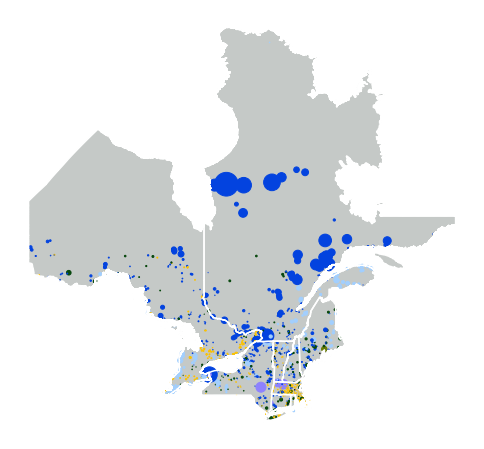

In [15]:
# Map Power Plants
gdf_r_renewplants['tech_color'] = gdf_r_renewplants['Primary Energy Source'].map(tech_colors)
gdf_r_renewplants['tech_color_hex'] = gdf_r_renewplants['Primary Energy Source'].map(tech_colors_hex)

# Map Power Plants, 100+ MW
fig, ax = plt.subplots(figsize=(12, 8))
gdf_ne.plot(ax=ax, color='xkcd:silver')
gdf_ne.boundary.plot(ax=ax, color='xkcd:white')
gdf_r_renewplants.plot(ax=ax, markersize=gdf_r_renewplants['Total Capacity (MW)'].div(10), color=gdf_r_renewplants['tech_color'])
plt.axis('off')
plt.show()

In [16]:
# Variable Size through Iterative Plotting
m = folium.Map(zoom_start=5, location=[48.70, -73.94], tiles="CartoDB positron") # ,

# Tooltip
tooltip_fields = ['Facility Name', 'Primary Energy Source', 'Total Capacity (MW)', 'Total Renewable Capacity (MW)', 
        'State / Province / Territory', 'City (Site Name)', 'County',
        'Coal (MW)',
       'Natural Gas (MW)', 'Petroleum (MW)', 'Other Energy Source (MW)',
       'Hydroelectric (MW)', 'Pumped-Storage Hydroelectric (MW)',
       'Nuclear (MW)', 'Solar (MW)', 'Wind (MW)', 'Geothermal (MW)',
       'Biomass (MW)', 'Tidal (MW)', 'Owner Name (Company)', 'Operator Name']

for idx, row in gdf_r_renewplants.iterrows():
    radius = 1*np.log(row['Total Capacity (MW)'])+1.5
    tooltip = '<br>'.join(["<strong>{}</strong>  |  {}".format(val, field) for field, val in row[tooltip_fields].iteritems()])
    folium.CircleMarker(
        location=[row.Latitude, row.Longitude],
        radius=radius,
        color=tech_colors_hex[row['Primary Energy Source']],
        stroke=False,
        fill=True,
        fill_opacity=0.6,
        opacity=1,
        tooltip=tooltip
    ).add_to(m)
m

## Unify Data Sources

In [17]:
# Take Small Renewables Subset (<100MW)
gdf_r_smallrenews = gdf_r_renewplants.loc[gdf_r_renewplants["Total Capacity (MW)"] < 100]
gdf_r_smallrenews

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period,geometry,tech_color,tech_color_hex
131,United States,126 Grove Solar LLC,126 Grove Solar LLC,NaN,42.076119,-71.422707,Franklin,Norfolk,Massachusetts,2028,...,2.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.42271 42.07612),xkcd:goldenrod,#fac205
134,United States,158th Fighter Wing Solar Farm,158th Fighter Wing,NaN,44.477705,-73.153412,South Burlington,Chittenden,Vermont,5403,...,1.5,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-73.15341 44.47771),xkcd:goldenrod,#fac205
136,United States,201 Sturbridge B,SE Solarne2 LLC,NaN,42.109143,-72.171188,Brimfield,Hampden,Massachusetts,1010,...,2.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-72.17119 42.10914),xkcd:goldenrod,#fac205
137,United States,205 Sturbridge A,SH Solarne2 LLC,NaN,42.109272,-72.170507,Brimfield,Hampden,Massachusetts,1010,...,3.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-72.17051 42.10927),xkcd:goldenrod,#fac205
143,United States,"265 Pleasant Solar NG, LLC",NuGen Capital Management,NaN,42.581389,-71.762222,Lunenburg,Worcester,Massachusetts,1462,...,1.2,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.76222 42.58139),xkcd:goldenrod,#fac205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6362,Canada,Settlers Landing,Settlers Landing Wind Development Joint Venture,Settlers Landing Wind Development Joint Venture,44.102000,-78.656171,Pontypool,NaN,Ontario,NaN,...,0.0,8.0,0.0,0.0,0,IESO,201703,POINT (-78.65617 44.10200),xkcd:baby blue,#a2cffe
6367,Canada,Southgate Solar,Southgate Solar LP,NaN,44.102000,-80.747197,Holstein,NaN,Ontario,NaN,...,50.0,0.0,0.0,0.0,0,IESO,201703,POINT (-80.74720 44.10200),xkcd:goldenrod,#fac205
6369,Canada,Témiscouata 1,Boralex,Boralex,47.636252,-69.122451,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,23.5,0.0,0.0,0,CanWEA,201612,POINT (-69.12245 47.63625),xkcd:baby blue,#a2cffe
6370,Canada,Témiscouata 2,Boralex,Boralex,47.621153,-69.129609,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,51.7,0.0,0.0,0,CanWEA,201612,POINT (-69.12961 47.62115),xkcd:baby blue,#a2cffe


In [18]:
# Combine Large Plants (100+MW) with Small Renewables Plants ([1-100) MW)
gdf_r_plants = pd.concat([gdf_r_powerplants, gdf_r_smallrenews])
gdf_r_plants

,Country,Facility Name,Owner Name (Company),Operator Name,Latitude,Longitude,City (Site Name),County,State / Province / Territory,Zip Code / Postal Code,...,Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW),Source Agency,Reference Period,geometry,tech_color,tech_color_hex
133,United States,500MW CC,New York Power Authority,NaN,40.788900,-73.906900,Astoria,Queens,New York,11105,...,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-73.90690 40.78890),xkcd:olive green,#677a04
169,United States,Androscoggin Energy Center,Verso Paper Androscoggin LLC,NaN,44.506315,-70.242312,Jay,Franklin,Maine,4239,...,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-70.24231 44.50632),xkcd:olive green,#677a04
171,United States,ANP Bellingham Energy Project,ANP Bellingham Energy Company LLC,NaN,42.110577,-71.453468,Bellingham,Norfolk,Massachusetts,2019,...,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.45347 42.11058),xkcd:olive green,#677a04
172,United States,ANP Blackstone Energy Project,ANP Blackstone Energy Company LLC,NaN,42.059876,-71.515811,Blackstone,Worcester,Massachusetts,1504,...,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-71.51581 42.05988),xkcd:olive green,#677a04
192,United States,Arthur Kill Generating Station,NRG Arthur Kill Operations Inc,NaN,40.591564,-74.200035,Staten Island,Richmond,New York,10314,...,0.0,0.0,0.0,0.0,0,"EIA-860, EIA-860M and EIA-923",201705,POINT (-74.20003 40.59156),xkcd:olive green,#677a04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6362,Canada,Settlers Landing,Settlers Landing Wind Development Joint Venture,Settlers Landing Wind Development Joint Venture,44.102000,-78.656171,Pontypool,NaN,Ontario,NaN,...,0.0,8.0,0.0,0.0,0,IESO,201703,POINT (-78.65617 44.10200),xkcd:baby blue,#a2cffe
6367,Canada,Southgate Solar,Southgate Solar LP,NaN,44.102000,-80.747197,Holstein,NaN,Ontario,NaN,...,50.0,0.0,0.0,0.0,0,IESO,201703,POINT (-80.74720 44.10200),xkcd:goldenrod,#fac205
6369,Canada,Témiscouata 1,Boralex,Boralex,47.636252,-69.122451,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,23.5,0.0,0.0,0,CanWEA,201612,POINT (-69.12245 47.63625),xkcd:baby blue,#a2cffe
6370,Canada,Témiscouata 2,Boralex,Boralex,47.621153,-69.129609,Saint-Honoré-de-Témiscouata,NaN,Québec,NaN,...,0.0,51.7,0.0,0.0,0,CanWEA,201612,POINT (-69.12961 47.62115),xkcd:baby blue,#a2cffe


# Final Map

In [19]:
# Map Unified Power Plants Dataset
# Variable Size through Iterative Plotting
m = folium.Map(zoom_start=5, location=[48.70, -73.94], tiles="CartoDB positron") # ,

# Tooltip
tooltip_fields = ['Facility Name', 'Primary Energy Source', 'Total Capacity (MW)', 'Total Renewable Capacity (MW)', 
        'State / Province / Territory', 'City (Site Name)', 'County',
        'Coal (MW)',
       'Natural Gas (MW)', 'Petroleum (MW)', 'Other Energy Source (MW)',
       'Hydroelectric (MW)', 'Pumped-Storage Hydroelectric (MW)',
       'Nuclear (MW)', 'Solar (MW)', 'Wind (MW)', 'Geothermal (MW)',
       'Biomass (MW)', 'Tidal (MW)', 'Owner Name (Company)', 'Operator Name']

for idx, row in gdf_r_plants.iterrows():
    radius = 1.5*np.log(row['Total Capacity (MW)'])+5
    tooltip = '<br>'.join(["<strong>{}</strong>  |  {}".format(val, field) for field, val in row[tooltip_fields].iteritems()])
    folium.CircleMarker(
        location=[row.Latitude, row.Longitude],
        radius=radius,
        color=tech_colors_hex[row['Primary Energy Source']],
        stroke=False,
        fill=True,
        fill_opacity=0.6,
        opacity=1,
        tooltip=tooltip
    ).add_to(m)
m

In [20]:
# Aggregate Regional Capacities

### THIS IS APPROXIMATE <---
# Some plants are multi-technology, but this sums the total capacity of the plant,
#  assigning all plant capacity to the plant's primary energy source.
# A more exact calculation will be trickier and less concise - return to do this later.

df_regional_capacities = gdf_r_plants.groupby(['State / Province / Territory','Primary Energy Source'])['Total Capacity (MW)'].sum()
df_regional_capacities

State / Province / Territory  Primary Energy Source
Connecticut                   Biomass                    254.3
                              Coal                       418.6
                              Hydroelectric              116.5
                              Natural Gas               2886.0
                              Nuclear                   2162.9
                              Petroleum                 2932.5
                              Pumped Storage              31.0
                              Solar                       20.8
                              Wind                         5.0
Maine                         Biomass                    796.8
                              Hydroelectric              691.9
                              Natural Gas               1850.5
                              Petroleum                  865.9
                              Wind                       898.8
Massachusetts                 Biomass                    340.8
   

In [21]:
# Determine Number of Plants with Multiple Sources 
# Answer 38! Including a handful of large misassignments. Fix Later. May explain some later discrepancies.
source_capacity_cols = ['Coal (MW)', 'Natural Gas (MW)', 'Petroleum (MW)', 
        'Other Energy Source (MW)', 'Hydroelectric (MW)', 'Pumped-Storage Hydroelectric (MW)',
       'Nuclear (MW)', 'Solar (MW)', 'Wind (MW)', 'Geothermal (MW)','Biomass (MW)', 'Tidal (MW)']
gdf_r_plants_has_source = gdf_r_plants[source_capacity_cols] != 0
source_sums_by_plant = gdf_r_plants_has_source.sum(axis=1)
multi_source_plant_indices = list(source_sums_by_plant.loc[source_sums_by_plant > 1].index)
gdf_r_plants.loc[multi_source_plant_indices][['Facility Name','State / Province / Territory','Total Capacity (MW)','Primary Energy Source'] + source_capacity_cols]

,Facility Name,State / Province / Territory,Total Capacity (MW),Primary Energy Source,Coal (MW),Natural Gas (MW),Petroleum (MW),Other Energy Source (MW),Hydroelectric (MW),Pumped-Storage Hydroelectric (MW),Nuclear (MW),Solar (MW),Wind (MW),Geothermal (MW),Biomass (MW),Tidal (MW)
201,Astoria Gas Turbines,New York,646.9,Natural Gas,0.0,502.8,144.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
201,Al Turi,New York,2.4,Biomass,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.4,0
259,Bethpage Power Plant,New York,240.0,Natural Gas,0.0,239.6,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
319,Brayton Point,Massachusetts,1600.1,Coal,1124.6,0.0,475.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
324,Bridgeport Station,Connecticut,418.6,Coal,400.0,0.0,18.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
343,Bucksport Generation LLC,Maine,298.4,Natural Gas,0.0,186.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,111.6,0
455,Cleary Flood,Massachusetts,146.3,Natural Gas,0.0,118.0,28.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
455,Beldens,Vermont,5.7,Hydroelectric,0.0,0.0,0.0,0.0,5.7,0.0,0.0,0.0,0.0,0.0,0.0,0
536,Danskammer Generating Station,New York,537.4,Natural Gas,0.0,532.0,5.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
663,Essential Power Massachusetts LLC,Massachusetts,250.6,Natural Gas,0.0,233.6,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


Québec 0 0
New York 0 1
Ontario 1 0
Massachusetts 1 1
Connecticut 2 0
Maine 2 1
New Hampshire 3 0
Rhode Island 3 1
Vermont 4 0


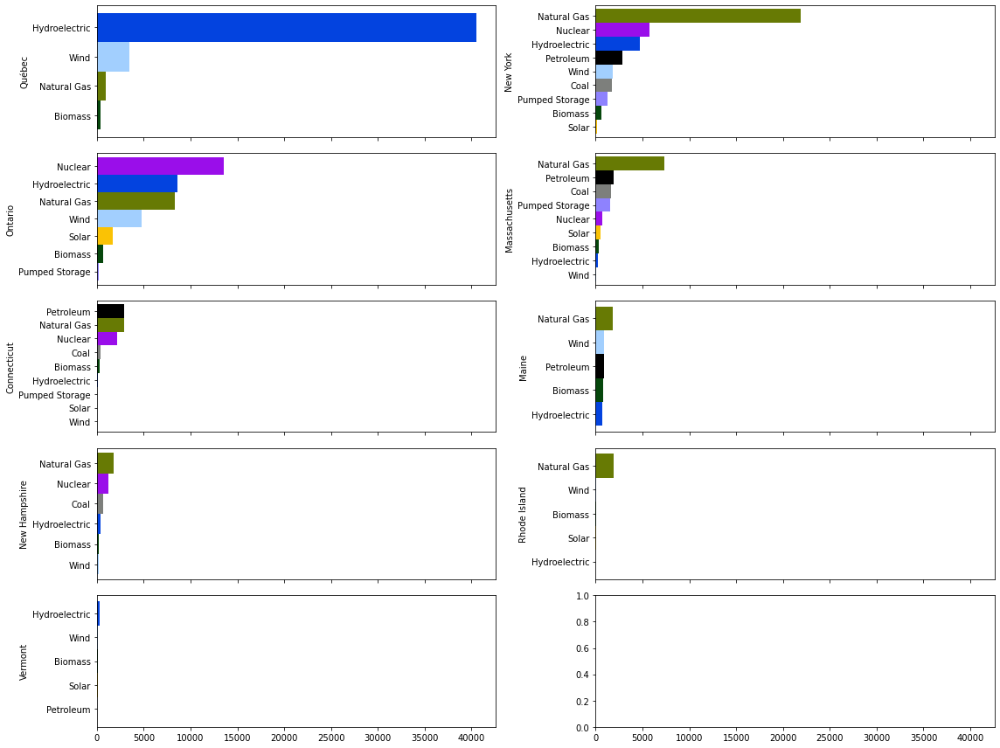

In [22]:
# Bar Plot of Regional Capacity by Technology
# Consider a WAFFLE PLOT instead

# Order Regions by Total Capacity
region_order_by_capacity = list(df_regional_capacities.groupby('State / Province / Territory').sum().sort_values(ascending=False).index)
region_order_by_capacity

fig, axes = plt.subplots(int(np.ceil(len(region_order_by_capacity)/2)), 2, figsize=(16,12), sharex=True)

for i in range(len(region_order_by_capacity)):
    region = region_order_by_capacity[i]
    ax = axes[int(np.floor(i/2))][i%2]
    print(region, int(np.floor(i/2)), i%2)
    
    reg_caps = df_regional_capacities.loc[region]
    reg_caps = reg_caps.sort_values(ascending=False)
    reg_colors = reg_caps.index.map(tech_colors)

    reg_caps.plot.barh(ax=ax, color=reg_colors, width=1)

    ax.set_ylabel(region)
    #ax.set_yticklabels([])
    #plt.gca().invert_yaxis()
    ax.invert_yaxis()

fig.tight_layout()
plt.show()

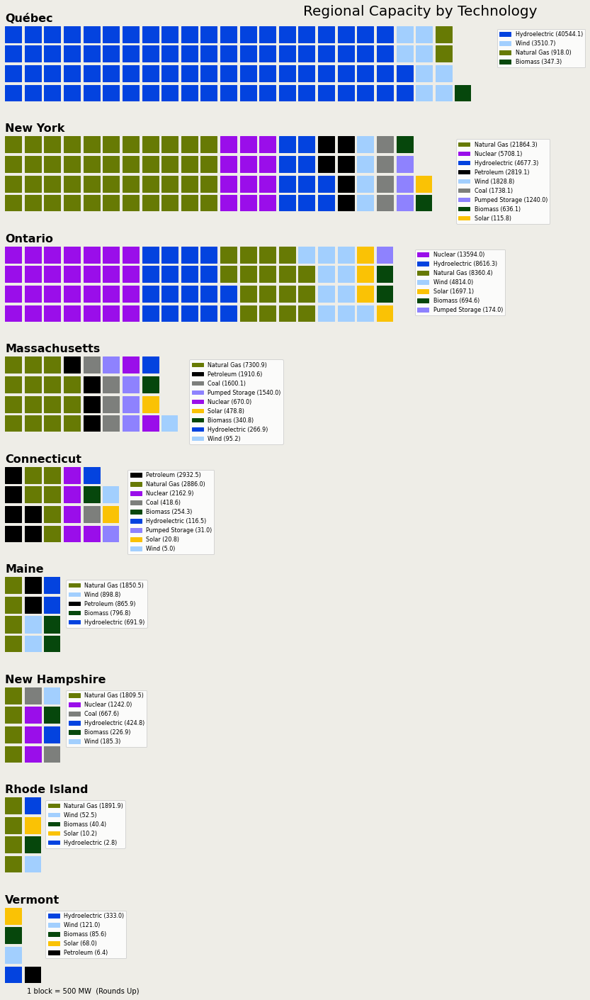

In [23]:
# Try Waffle Chart 

PLOTS = dict()
for region in region_order_by_capacity:
    reg_caps = df_regional_capacities.loc[region].sort_values(ascending=False)
    PLOTS[region] = {
        'values' : [value/500 for value in reg_caps],
        'labels' : ["{} ({})".format(index, np.round(value,1)) for value, index in zip(reg_caps,reg_caps.index)],
        'legend' : {'loc': 'upper left', 'bbox_to_anchor': (1.05, 1), 'fontsize': 8},
        'title'  : {'label': '{}'.format(region), 'loc': 'left', 'fontsize': 16, 'fontweight':'bold'},
        'colors' : [tech_colors_hex[tech] for tech in reg_caps.index]
    }
plot_indices = [911 + i for i in range(len(region_order_by_capacity))]

fig = plt.figure(
    FigureClass=Waffle,
    plots={
        idx : PLOTS[reg] for (idx, reg) in zip(plot_indices, region_order_by_capacity)
    },
    rows=4,  # Outside parameter applied to all subplots, same as below
    cmap_name="Accent",  # Change color with cmap
    rounding_rule='ceil',  # Change rounding rule, so value less than 1000 will still have at least 1 block
    figsize=(12, 20)
)

# Add a title and a small detail at the bottom
fig.suptitle('Regional Capacity by Technology', fontsize=20, ha='left')
fig.supxlabel('1 block = 500 MW  (Rounds Up)',
              fontsize=10,
              x=0.14, # position at the 14% axis
             )
fig.set_facecolor('#EEEDE7')

plt.show()

## Compare Data Sources

(Canadian Provinces Only)

In [24]:
# Read Regional Installed Capacities
df_installed_cap = pd.read_csv(installed_cap_filepath)
df_installed_cap

,REF_DATE,GEO,DGUID,Class of electricity producer,Type of electricity generation,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
0,2006,Canada,2016A000011124,Total all classes of electricity producer,Total installed capacity,Kilowatts,200,units,0,v53517872,1.1.1,123003404.0,NaN,NaN,NaN,0
1,2006,Canada,2016A000011124,Total all classes of electricity producer,Hydraulic turbine,Kilowatts,200,units,0,v53517874,1.1.2,72644118.0,NaN,NaN,NaN,0
2,2006,Canada,2016A000011124,Total all classes of electricity producer,Wind power turbine,Kilowatts,200,units,0,v53517875,1.1.3,1470499.0,NaN,NaN,NaN,0
3,2006,Canada,2016A000011124,Total all classes of electricity producer,Tidal power turbine,Kilowatts,200,units,0,v53517876,1.1.4,3700.0,NaN,NaN,NaN,0
4,2006,Canada,2016A000011124,Total all classes of electricity producer,Total thermal,Kilowatts,200,units,0,v53517877,1.1.6,48885087.0,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5456,2022,Nunavut,2016A000262,Total all classes of electricity producer,Total thermal,Kilowatts,200,units,0,v53517991,14.1.6,78415.0,NaN,NaN,NaN,0
5457,2022,Nunavut,2016A000262,Total all classes of electricity producer,Internal combustion turbine,Kilowatts,200,units,0,v53517990,14.1.10,78415.0,NaN,NaN,NaN,0
5458,2022,Nunavut,2016A000262,"Electricity producer, public electric utilities",Total installed capacity,Kilowatts,200,units,0,v53517992,14.2.1,78415.0,NaN,NaN,NaN,0
5459,2022,Nunavut,2016A000262,"Electricity producer, public electric utilities",Total thermal,Kilowatts,200,units,0,v53517994,14.2.6,78415.0,NaN,NaN,NaN,0


In [25]:
# Filter Installed Capacities to 2022, all classes
df_all_2022 = df_installed_cap.loc[(df_installed_cap.REF_DATE==2022) & (df_installed_cap['Class of electricity producer'] == 'Total all classes of electricity producer')]
df_all_2022

,REF_DATE,GEO,DGUID,Class of electricity producer,Type of electricity generation,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
5119,2022,Canada,2016A000011124,Total all classes of electricity producer,Total installed capacity,Kilowatts,200,units,0,v53517872,1.1.1,152206558.0,NaN,NaN,NaN,0
5120,2022,Canada,2016A000011124,Total all classes of electricity producer,Hydraulic turbine,Kilowatts,200,units,0,v53517874,1.1.2,82206565.0,NaN,NaN,NaN,0
5121,2022,Canada,2016A000011124,Total all classes of electricity producer,Wind power turbine,Kilowatts,200,units,0,v53517875,1.1.3,16169469.0,NaN,NaN,NaN,0
5122,2022,Canada,2016A000011124,Total all classes of electricity producer,Tidal power turbine,Kilowatts,200,units,0,v53517876,1.1.4,0.0,NaN,NaN,NaN,0
5123,2022,Canada,2016A000011124,Total all classes of electricity producer,Solar power,Kilowatts,200,units,0,v54259658,1.1.5,3103878.0,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5439,2022,Northwest Territories,2016A000261,Total all classes of electricity producer,Combustion turbine,Kilowatts,200,units,0,v53517976,13.1.9,19500.0,NaN,NaN,NaN,0
5440,2022,Northwest Territories,2016A000261,Total all classes of electricity producer,Internal combustion turbine,Kilowatts,200,units,0,v53517973,13.1.10,122781.0,NaN,NaN,NaN,0
5455,2022,Nunavut,2016A000262,Total all classes of electricity producer,Total installed capacity,Kilowatts,200,units,0,v53517989,14.1.1,78415.0,NaN,NaN,NaN,0
5456,2022,Nunavut,2016A000262,Total all classes of electricity producer,Total thermal,Kilowatts,200,units,0,v53517991,14.1.6,78415.0,NaN,NaN,NaN,0


In [26]:
# Compare Ontario
df_ic_on = df_all_2022.loc[df_all_2022.GEO == 'Ontario']

# Assumes that CT + ST + IC are all Natural Gas from Installed Capacity Source

print("        ONTARIO CAPACITY COMPARISON BY SOURCE       ")
print("--------------------------------------------------")
print("TECH            | INSTALLED CAPACITIES | AGGREGATED MAP")
print("--------------------------------------------------")
print("{:<15} | {:>20} | {:>10}".format("NUCLEAR",df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Nuclear steam turbine'].VALUE.iloc[0]/1000,df_regional_capacities.loc['Ontario','Nuclear']))
print("{:<15} | {:>20} | {:>10}".format("HYDRO",df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Hydraulic turbine'].VALUE.iloc[0]/1000,df_regional_capacities.loc['Ontario','Hydroelectric']))
print("{:<15} | {:>20} | {:>10}".format("PUMPED HYDRO","??? ^ ???",df_regional_capacities.loc['Ontario','Pumped Storage']))
print("{:<15} | {:>20} | {:>10}".format("NATURAL GAS",np.round(df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Combustion turbine'].VALUE.iloc[0]/1000 + df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Conventional steam turbine'].VALUE.iloc[0]/1000 + df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Internal combustion turbine'].VALUE.iloc[0]/1000,3),df_regional_capacities.loc['Ontario','Natural Gas']))
print("{:<15} | {:>20} | {:>10}".format("BIOMASS","??? ^ ???",df_regional_capacities.loc['Ontario','Biomass']))
print("{:<15} | {:>20} | {:>10}".format("SOLAR",df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Solar power'].VALUE.iloc[0]/1000,df_regional_capacities.loc['Ontario','Solar']))
print("{:<15} | {:>20} | {:>10}".format("WIND",df_ic_on.loc[df_ic_on['Type of electricity generation'] == 'Wind power turbine'].VALUE.iloc[0]/1000,df_regional_capacities.loc['Ontario','Wind']))

df_ic_on

        ONTARIO CAPACITY COMPARISON BY SOURCE       
--------------------------------------------------
TECH            | INSTALLED CAPACITIES | AGGREGATED MAP
--------------------------------------------------
NUCLEAR         |              13798.0 |    13594.0
HYDRO           |             8977.401 |     8616.3
PUMPED HYDRO    |            ??? ^ ??? |      174.0
NATURAL GAS     |            11252.002 |     8360.4
BIOMASS         |            ??? ^ ??? |      694.6
SOLAR           |             1916.873 |     1697.1
WIND            |             5535.122 |     4814.0


,REF_DATE,GEO,DGUID,Class of electricity producer,Type of electricity generation,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
5276,2022,Ontario,2016A000235,Total all classes of electricity producer,Total installed capacity,Kilowatts,200,units,0,v53518098,7.1.1,41480148.0,NaN,NaN,NaN,0
5277,2022,Ontario,2016A000235,Total all classes of electricity producer,Hydraulic turbine,Kilowatts,200,units,0,v53518100,7.1.2,8977401.0,NaN,NaN,NaN,0
5278,2022,Ontario,2016A000235,Total all classes of electricity producer,Wind power turbine,Kilowatts,200,units,0,v53518101,7.1.3,5535122.0,NaN,NaN,NaN,0
5279,2022,Ontario,2016A000235,Total all classes of electricity producer,Solar power,Kilowatts,200,units,0,v54259663,7.1.5,1916873.0,NaN,NaN,NaN,0
5280,2022,Ontario,2016A000235,Total all classes of electricity producer,Other non-combustibles,Kilowatts,200,units,0,v1582431633,7.1.11,750.0,NaN,NaN,NaN,0
5281,2022,Ontario,2016A000235,Total all classes of electricity producer,Total thermal,Kilowatts,200,units,0,v53518102,7.1.6,25050002.0,NaN,NaN,NaN,0
5282,2022,Ontario,2016A000235,Total all classes of electricity producer,Conventional steam turbine,Kilowatts,200,units,0,v53518103,7.1.7,4980560.0,NaN,NaN,NaN,0
5283,2022,Ontario,2016A000235,Total all classes of electricity producer,Nuclear steam turbine,Kilowatts,200,units,0,v53518104,7.1.8,13798000.0,NaN,NaN,NaN,0
5284,2022,Ontario,2016A000235,Total all classes of electricity producer,Combustion turbine,Kilowatts,200,units,0,v53518105,7.1.9,6026418.0,NaN,NaN,NaN,0
5285,2022,Ontario,2016A000235,Total all classes of electricity producer,Internal combustion turbine,Kilowatts,200,units,0,v53518099,7.1.10,245024.0,NaN,NaN,NaN,0


In [27]:
# Compare Quebec
df_ic_qc = df_all_2022.loc[df_all_2022.GEO == 'Quebec']

# Assumes that CT + ST + IC are all Natural Gas from Installed Capacity Source

print("         QUEBEC CAPACITY COMPARISON BY SOURCE       ")
print("--------------------------------------------------")
print("TECH            | INSTALLED CAPACITIES | AGGREGATED MAP")
print("--------------------------------------------------")
print("{:<15} | {:>20} | {:>10}".format("HYDRO",df_ic_qc.loc[df_ic_qc['Type of electricity generation'] == 'Hydraulic turbine'].VALUE.iloc[0]/1000,df_regional_capacities.loc['Québec','Hydroelectric']))
print("{:<15} | {:>20} | {:>10}".format("NATURAL GAS",np.round(df_ic_qc.loc[df_ic_qc['Type of electricity generation'] == 'Combustion turbine'].VALUE.iloc[0]/1000 + df_ic_qc.loc[df_ic_qc['Type of electricity generation'] == 'Conventional steam turbine'].VALUE.iloc[0]/1000 + df_ic_qc.loc[df_ic_qc['Type of electricity generation'] == 'Internal combustion turbine'].VALUE.iloc[0]/1000,3),df_regional_capacities.loc['Québec','Natural Gas']))
print("{:<15} | {:>20} | {:>10}".format("BIOMASS","??? ^ ???",df_regional_capacities.loc['Québec','Biomass']))
print("{:<15} | {:>20} | {:>10}".format("WIND",df_ic_qc.loc[df_ic_qc['Type of electricity generation'] == 'Wind power turbine'].VALUE.iloc[0]/1000,df_regional_capacities.loc['Québec','Wind']))

df_ic_qc

         QUEBEC CAPACITY COMPARISON BY SOURCE       
--------------------------------------------------
TECH            | INSTALLED CAPACITIES | AGGREGATED MAP
--------------------------------------------------
HYDRO           |            40649.344 |    40544.1
NATURAL GAS     |             1532.228 |      918.0
BIOMASS         |            ??? ^ ??? |      347.3
WIND            |             3970.168 |     3510.7


,REF_DATE,GEO,DGUID,Class of electricity producer,Type of electricity generation,UOM,UOM_ID,SCALAR_FACTOR,SCALAR_ID,VECTOR,COORDINATE,VALUE,STATUS,SYMBOL,TERMINATED,DECIMALS
5245,2022,Quebec,2016A000224,Total all classes of electricity producer,Total installed capacity,Kilowatts,200,units,0,v53518071,6.1.1,46163540.0,NaN,NaN,NaN,0
5246,2022,Quebec,2016A000224,Total all classes of electricity producer,Hydraulic turbine,Kilowatts,200,units,0,v53518073,6.1.2,40649344.0,NaN,NaN,NaN,0
5247,2022,Quebec,2016A000224,Total all classes of electricity producer,Wind power turbine,Kilowatts,200,units,0,v53518074,6.1.3,3970168.0,NaN,NaN,NaN,0
5248,2022,Quebec,2016A000224,Total all classes of electricity producer,Solar power,Kilowatts,200,units,0,v110824692,6.1.5,11800.0,NaN,NaN,NaN,0
5249,2022,Quebec,2016A000224,Total all classes of electricity producer,Total thermal,Kilowatts,200,units,0,v53518075,6.1.6,1532228.0,NaN,NaN,NaN,0
5250,2022,Quebec,2016A000224,Total all classes of electricity producer,Conventional steam turbine,Kilowatts,200,units,0,v53518076,6.1.7,541230.0,NaN,NaN,NaN,0
5251,2022,Quebec,2016A000224,Total all classes of electricity producer,Nuclear steam turbine,Kilowatts,200,units,0,v53518077,6.1.8,NaN,..,NaN,NaN,0
5252,2022,Quebec,2016A000224,Total all classes of electricity producer,Combustion turbine,Kilowatts,200,units,0,v53518078,6.1.9,803600.0,NaN,NaN,NaN,0
5253,2022,Quebec,2016A000224,Total all classes of electricity producer,Internal combustion turbine,Kilowatts,200,units,0,v53518072,6.1.10,187398.0,NaN,NaN,NaN,0


In [28]:
df_regional_capacities.loc['Ontario']

Primary Energy Source
Biomass             694.6
Hydroelectric      8616.3
Natural Gas        8360.4
Nuclear           13594.0
Pumped Storage      174.0
Solar              1697.1
Wind               4814.0
Name: Total Capacity (MW), dtype: float64

In [29]:
df_regional_capacities.loc['Québec']

Primary Energy Source
Biomass            347.3
Hydroelectric    40544.1
Natural Gas        918.0
Wind              3510.7
Name: Total Capacity (MW), dtype: float64